In [166]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime as dt
import time
import folium

In [174]:
park = pd.read_csv('../data/parking_sample.csv', index_col=0)
addr = pd.read_csv('../data/address3.csv', index_col=0)

In [175]:
def unpack(row):
    txt = row['location'].replace('(','').replace(')','').split(', ')
    try:
        return {'lat': float(txt[0]), 'long': float(txt[1])}
    except:
        return np.nan

addr = pd.concat([addr, addr.apply(unpack, axis=1, result_type='expand')], axis=1)
addr.drop(columns=['location'],inplace=True)

,Address,lat,long
0,309 HEMLOCK STREET NYC,40.682302,-73.870543
1,420 BEACH 65TH ST NYC,40.593632,-73.794017
2,100 Greene St NYC,40.724235,-73.999690
3,345 W 16th St NYC,40.742033,-74.003289
4,1332 Lexington Ave NYC,40.781374,-73.954393
...,...,...,...
51809,35-26 Farrington St NYC,40.763701,-73.831755
51812,121 W 188th St NYC,40.853633,-73.930415
51813,944 Amsterdam Ave NYC,40.777744,-73.982290
51815,32-24 Steinway St NYC,40.758420,-73.919659


In [160]:
def clean_time(row):
    if row[-1] not in ['A','P']:
        return pd.to_datetime(row, format='%H%M')
    
    elif row[:2] == '00':
        row = '12' + row[2:]
    row += 'M'
    return pd.to_datetime(row, format='%I%M%p')
    

park['new_time'] = park['Violation Time'].apply(clean_time).dt.time
# park['new_time'] = park['new_time'].apply(lambda x: x.strftime('%H:%M'))


In [161]:
park[['new_time','Violation Time']]

,new_time,Violation Time
0,09:52:00,0952A
1,11:42:00,1142A
2,10:40:00,1040A
3,12:40:00,1240P
4,13:19:00,0119P
...,...,...
51814,07:51:00,0751A
51815,13:11:00,0111P
51816,14:43:00,0243P
51817,05:54:00,0554A


In [124]:
time_grp = park.groupby(['new_time','Violation Code'])[['Summons Number']].count().reset_index()
time_grp



,new_time,Violation Code,Summons Number
0,00:00,14,1
1,00:00,21,2
2,00:00,46,3
3,00:01,20,1
4,00:02,20,2
...,...,...,...
4740,23:57,46,1
4741,23:58,20,1
4742,23:59,14,2
4743,23:59,20,1


In [164]:
park['new_time'].max()

datetime.time(23, 59)

<ipython-input-165-2f5b2c9f9dbe>:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(time_grp['new_time'])


''

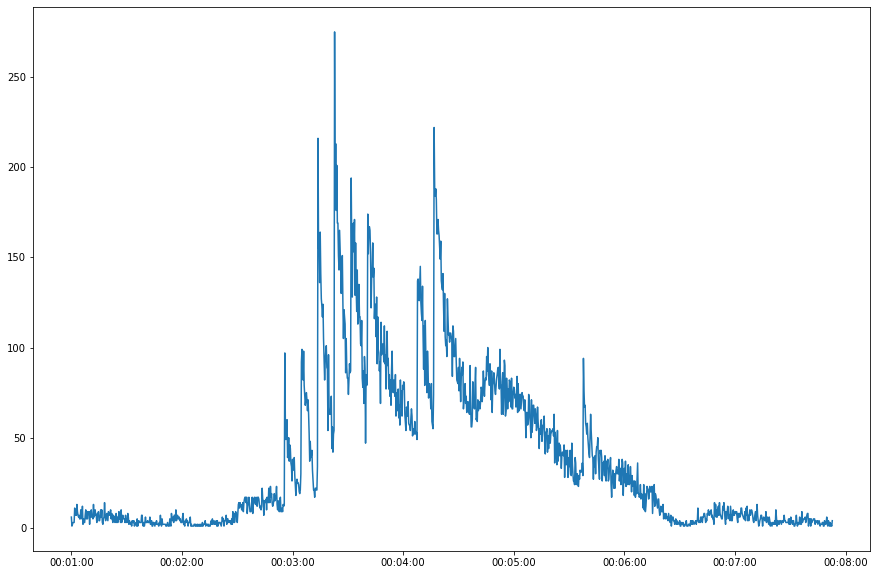

In [165]:
time_grp = park.groupby(['new_time'])[['Summons Number']].count().reset_index()
# min_t = time_grp['new_time'].min()
# max_t = time_grp['new_time'].max()
# dt_range = pd.date_range(min_t,max_t,24).strftime('%H:%M')

fig, ax = plt.subplots(figsize=(15,10))

# ax.set_xticks(dt_range)

ax.plot(time_grp['Summons Number'])
ax.set_xticklabels(time_grp['new_time'])
# ax.set_xlim((np.datetime64('00:00'),np.datetime64('23:59')))
;

''

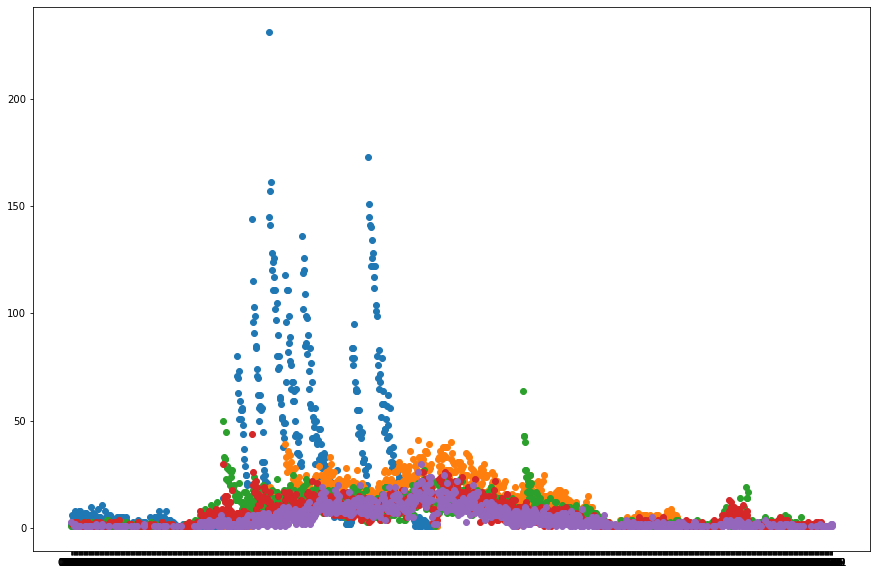

In [129]:
codes = [21,38,14,20,46]

fig, ax = plt.subplots(figsize=(15,10))
for code in codes:
    mask = time_grp['Violation Code'] == code
    ax.scatter(time_grp[mask]['new_time'], time_grp[mask]['Summons Number'])
;

In [137]:
time_grp = park.groupby(['new_time'])[['Summons Number']].count().reset_index()
min_t = time_grp['new_time'].min()
max_t = time_grp['new_time'].max()
dt_range = pd.date_range(min_t,max_t,24).strftime('%H:%M')


Index(['00:00', '01:02', '02:05', '03:07', '04:10', '05:12', '06:15', '07:17',
       '08:20', '09:23', '10:25', '11:28', '12:30', '13:33', '14:35', '15:38',
       '16:41', '17:43', '18:46', '19:48', '20:51', '21:53', '22:56', '23:59'],
      dtype='object')

In [141]:
np.array(dt_range)

array(['00:00', '01:02', '02:05', '03:07', '04:10', '05:12', '06:15',
       '07:17', '08:20', '09:23', '10:25', '11:28', '12:30', '13:33',
       '14:35', '15:38', '16:41', '17:43', '18:46', '19:48', '20:51',
       '21:53', '22:56', '23:59'], dtype=object)

In [172]:
m = folium.Map(location=[40.7128, -74.0060])

for x, y in zip(addr.lat,addr.long):
    folium.Marker([x, y]).add_to(m)
m